In [1]:
import pandas as pd
import numpy as np
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn.model_selection import train_test_split , GridSearchCV
from sklearn.metrics import accuracy_score , confusion_matrix, roc_auc_score , roc_curve
from pandas_profiling import ProfileReport

In [3]:
df = pd.read_csv('winequality_red.csv')

In [4]:
df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [6]:
set(df.quality)

{3, 4, 5, 6, 7, 8}

In [7]:
pd.read_csv('https://raw.githubusercontent.com/sumukhakaparthi/Wine-Quality/master/winequality_edited.csv')

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality,color,acidity_levels
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,red,Low
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5,red,Moderately_High
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5,red,Medium
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6,red,Moderately_High
4,7.4,0.66,0.00,1.8,0.075,13.0,40.0,0.99780,3.51,0.56,9.4,5,red,Low
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5315,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,6,white,Medium
5316,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,5,white,Moderately_High
5317,6.5,0.24,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4,6,white,High
5318,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,7,white,Low


In [8]:
ProfileReport(df)

In [9]:
df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [11]:
x = df.drop(columns='quality')

In [12]:
y = df.quality

In [13]:
x

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2


In [14]:
y

0       5
1       5
2       5
3       6
4       5
       ..
1594    5
1595    6
1596    6
1597    5
1598    6
Name: quality, Length: 1599, dtype: int64

In [15]:
x_train , x_test , y_train , y_test = train_test_split(x,y , test_size = .20 , random_state = 0)

In [16]:
x_train

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
642,9.9,0.540,0.45,2.3,0.071,16.0,40.0,0.99910,3.39,0.62,9.4
679,10.8,0.260,0.45,3.3,0.060,20.0,49.0,0.99720,3.13,0.54,9.6
473,9.9,0.350,0.55,2.1,0.062,5.0,14.0,0.99710,3.26,0.79,10.6
390,5.6,0.850,0.05,1.4,0.045,12.0,88.0,0.99240,3.56,0.82,12.9
1096,6.6,0.725,0.09,5.5,0.117,9.0,17.0,0.99655,3.35,0.49,10.8
...,...,...,...,...,...,...,...,...,...,...,...
763,9.3,0.655,0.26,2.0,0.096,5.0,35.0,0.99738,3.25,0.42,9.6
835,7.6,0.665,0.10,1.5,0.066,27.0,55.0,0.99655,3.39,0.51,9.3
1216,7.9,0.570,0.31,2.0,0.079,10.0,79.0,0.99677,3.29,0.69,9.5
559,13.0,0.470,0.49,4.3,0.085,6.0,47.0,1.00210,3.30,0.68,12.7


In [17]:
x_test

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
1109,10.8,0.470,0.43,2.10,0.171,27.0,66.0,0.99820,3.17,0.76,10.8
1032,8.1,0.820,0.00,4.10,0.095,5.0,14.0,0.99854,3.36,0.53,9.6
1002,9.1,0.290,0.33,2.05,0.063,13.0,27.0,0.99516,3.26,0.84,11.7
487,10.2,0.645,0.36,1.80,0.053,5.0,14.0,0.99820,3.17,0.42,10.0
979,12.2,0.450,0.49,1.40,0.075,3.0,6.0,0.99690,3.13,0.63,10.4
...,...,...,...,...,...,...,...,...,...,...,...
794,10.1,0.270,0.54,2.30,0.065,7.0,26.0,0.99531,3.17,0.53,12.5
813,6.9,0.390,0.24,2.10,0.102,4.0,7.0,0.99462,3.44,0.58,11.4
1322,9.1,0.340,0.42,1.80,0.058,9.0,18.0,0.99392,3.18,0.55,11.4
704,9.1,0.765,0.04,1.60,0.078,4.0,14.0,0.99800,3.29,0.54,9.7


In [18]:
y_train

642     5
679     5
473     5
390     8
1096    6
       ..
763     5
835     5
1216    6
559     6
684     5
Name: quality, Length: 1279, dtype: int64

In [19]:
y_test

1109    6
1032    5
1002    7
487     6
979     5
       ..
794     6
813     4
1322    5
704     4
1023    6
Name: quality, Length: 320, dtype: int64

In [20]:
dt_model = DecisionTreeClassifier()

In [21]:
dt_model.fit(x_train,y_train)

DecisionTreeClassifier()

In [23]:
from sklearn import tree
import matplotlib.pyplot as plt

[Text(483.8867173494084, 1061.3142857142857, 'X[10] <= 10.35\ngini = 0.648\nsamples = 1279\nvalue = [8, 42, 546, 496, 172, 15]'),
 Text(242.52442631767659, 1009.5428571428572, 'X[9] <= 0.585\ngini = 0.527\nsamples = 703\nvalue = [5, 23, 428, 222, 24, 1]'),
 Text(49.092595912513445, 957.7714285714286, 'X[10] <= 9.075\ngini = 0.42\nsamples = 331\nvalue = [3, 15, 242, 69, 2, 0]'),
 Text(9.60344209394048, 906.0, 'X[6] <= 71.0\ngini = 0.587\nsamples = 15\nvalue = [0, 2, 5, 8, 0, 0]'),
 Text(6.402294729293653, 854.2285714285715, 'X[7] <= 0.996\ngini = 0.43\nsamples = 11\nvalue = [0, 2, 1, 8, 0, 0]'),
 Text(3.2011473646468267, 802.4571428571429, 'gini = 0.0\nsamples = 2\nvalue = [0, 2, 0, 0, 0, 0]'),
 Text(9.60344209394048, 802.4571428571429, 'X[0] <= 13.25\ngini = 0.198\nsamples = 9\nvalue = [0, 0, 1, 8, 0, 0]'),
 Text(6.402294729293653, 750.6857142857143, 'gini = 0.0\nsamples = 8\nvalue = [0, 0, 0, 8, 0, 0]'),
 Text(12.804589458587307, 750.6857142857143, 'gini = 0.0\nsamples = 1\nvalue = [0

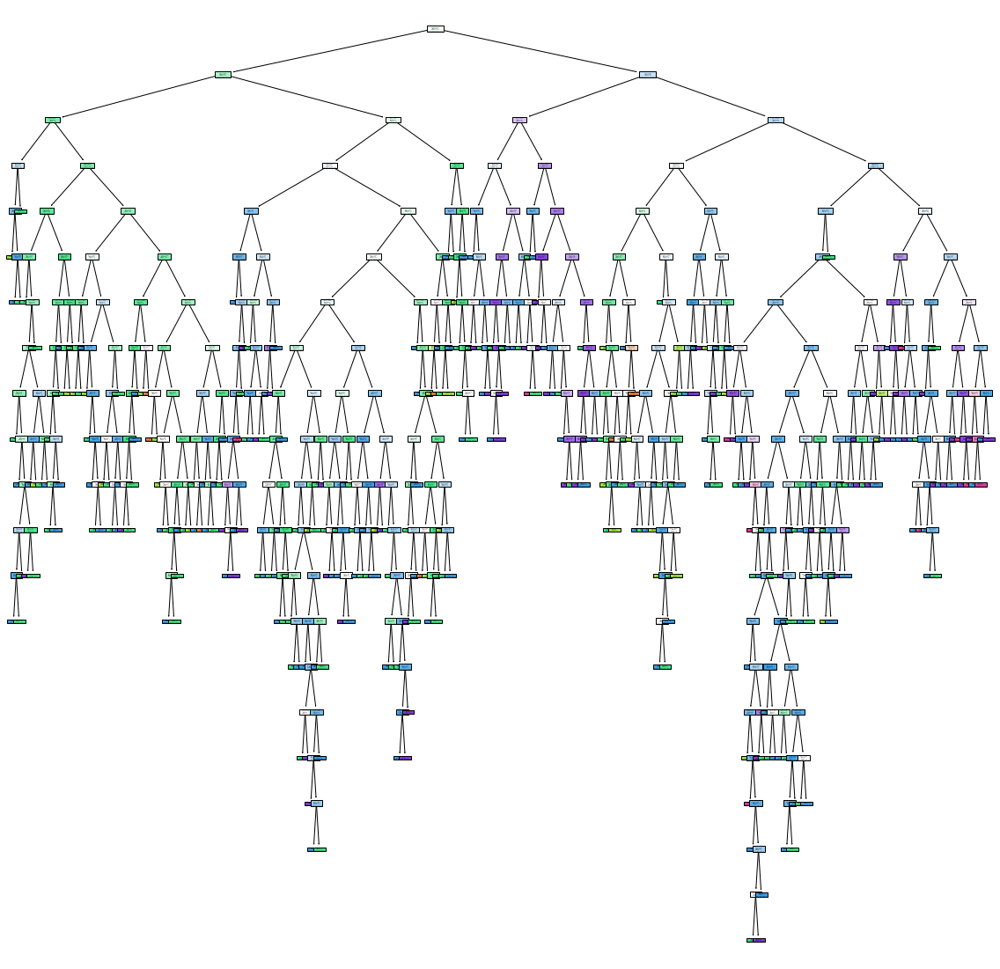

In [25]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model ,filled=True)

In [26]:
df

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5


In [40]:
df1 = df.head(50)

In [46]:
set(df1.quality)

{4, 5, 6, 7}

In [41]:
x1 = df1.drop(columns='quality')

In [42]:
y1 = df1.quality

In [43]:
df_model1 = DecisionTreeClassifier()
df_model1.fit(x1,y1)

DecisionTreeClassifier()

[Text(462.09375, 1032.8400000000001, 'sulphates <= 0.515\ngini = 0.538\nsamples = 50\nvalue = [4, 32, 10, 4]\nclass = 5'),
 Text(209.25, 924.1200000000001, 'sulphates <= 0.475\ngini = 0.56\nsamples = 5\nvalue = [3, 1, 0, 1]\nclass = 4'),
 Text(139.5, 815.4000000000001, 'density <= 0.995\ngini = 0.5\nsamples = 2\nvalue = [0, 1, 0, 1]\nclass = 5'),
 Text(69.75, 706.6800000000001, 'gini = 0.0\nsamples = 1\nvalue = [0, 0, 0, 1]\nclass = 7'),
 Text(209.25, 706.6800000000001, 'gini = 0.0\nsamples = 1\nvalue = [0, 1, 0, 0]\nclass = 5'),
 Text(279.0, 815.4000000000001, 'gini = 0.0\nsamples = 3\nvalue = [3, 0, 0, 0]\nclass = 4'),
 Text(714.9375, 924.1200000000001, 'alcohol <= 10.55\ngini = 0.471\nsamples = 45\nvalue = [1, 31, 10, 3]\nclass = 5'),
 Text(523.125, 815.4000000000001, 'volatile acidity <= 0.285\ngini = 0.414\nsamples = 42\nvalue = [0, 31, 8, 3]\nclass = 5'),
 Text(348.75, 706.6800000000001, 'fixed acidity <= 8.7\ngini = 0.444\nsamples = 3\nvalue = [0, 0, 2, 1]\nclass = 6'),
 Text(27

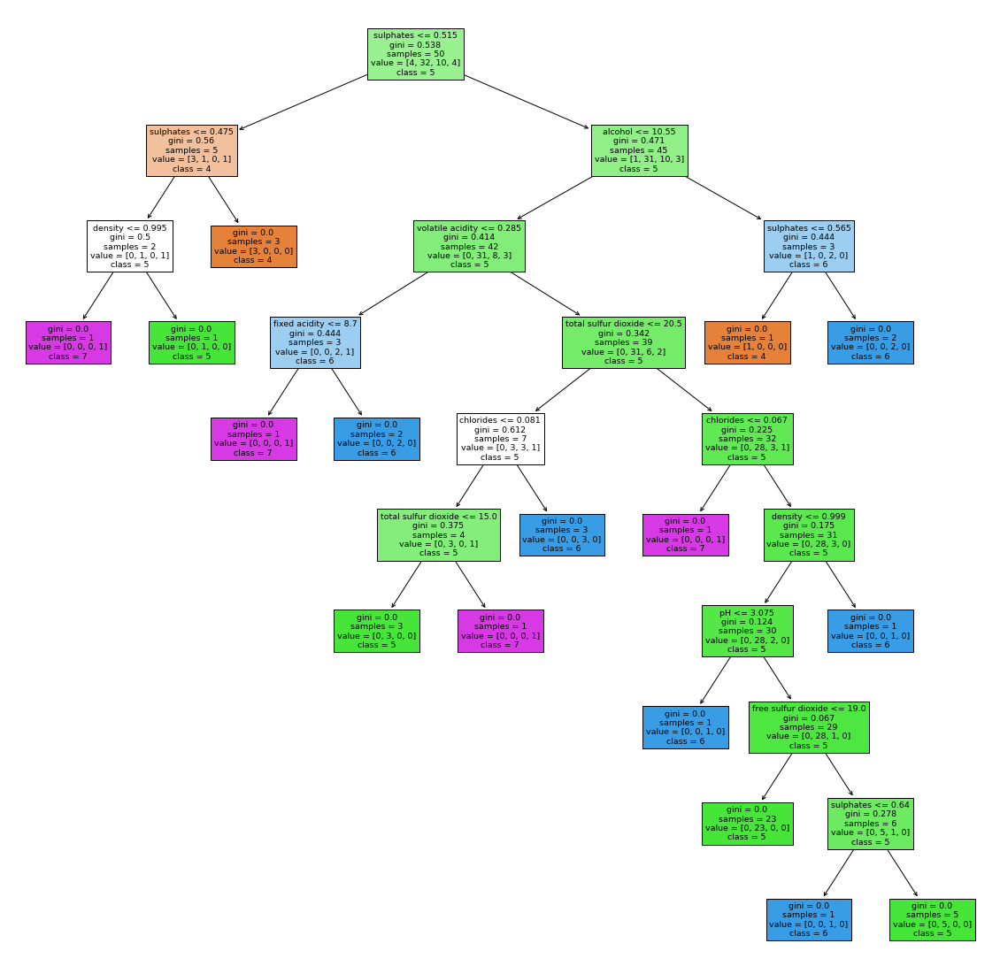

In [53]:
plt.figure(figsize=(20,20))
tree.plot_tree(df_model1,filled=True,feature_names=x1.columns ,class_names = [str(i) for i in set(y1)])

In [54]:
plt.savefig('dt1_model_1')

<Figure size 432x288 with 0 Axes>

In [48]:
df

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5


In [49]:
dt_model

DecisionTreeClassifier()

[Text(483.8867173494084, 1061.3142857142857, 'X[10] <= 10.35\ngini = 0.648\nsamples = 1279\nvalue = [8, 42, 546, 496, 172, 15]'),
 Text(242.52442631767659, 1009.5428571428572, 'X[9] <= 0.585\ngini = 0.527\nsamples = 703\nvalue = [5, 23, 428, 222, 24, 1]'),
 Text(49.092595912513445, 957.7714285714286, 'X[10] <= 9.075\ngini = 0.42\nsamples = 331\nvalue = [3, 15, 242, 69, 2, 0]'),
 Text(9.60344209394048, 906.0, 'X[6] <= 71.0\ngini = 0.587\nsamples = 15\nvalue = [0, 2, 5, 8, 0, 0]'),
 Text(6.402294729293653, 854.2285714285715, 'X[7] <= 0.996\ngini = 0.43\nsamples = 11\nvalue = [0, 2, 1, 8, 0, 0]'),
 Text(3.2011473646468267, 802.4571428571429, 'gini = 0.0\nsamples = 2\nvalue = [0, 2, 0, 0, 0, 0]'),
 Text(9.60344209394048, 802.4571428571429, 'X[0] <= 13.25\ngini = 0.198\nsamples = 9\nvalue = [0, 0, 1, 8, 0, 0]'),
 Text(6.402294729293653, 750.6857142857143, 'gini = 0.0\nsamples = 8\nvalue = [0, 0, 0, 8, 0, 0]'),
 Text(12.804589458587307, 750.6857142857143, 'gini = 0.0\nsamples = 1\nvalue = [0

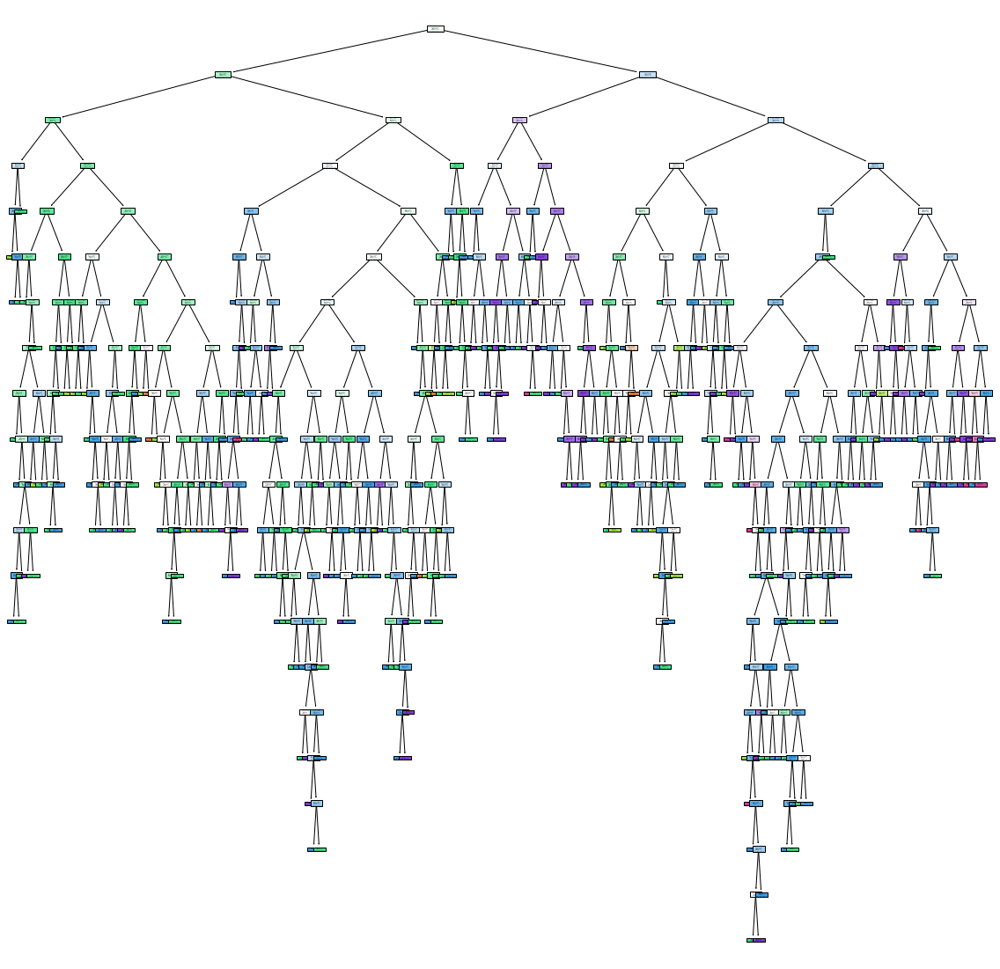

In [51]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model,filled=True)

In [55]:
dt_model.predict(x_test)

array([6, 5, 7, 5, 5, 6, 5, 6, 5, 5, 5, 5, 6, 5, 6, 7, 7, 5, 5, 6, 8, 5,
       6, 6, 5, 6, 5, 7, 5, 6, 6, 6, 6, 6, 7, 7, 5, 6, 6, 7, 5, 7, 5, 7,
       5, 5, 5, 6, 7, 6, 5, 4, 6, 6, 6, 5, 5, 5, 6, 5, 5, 6, 6, 6, 5, 6,
       5, 5, 7, 6, 6, 6, 4, 5, 6, 6, 5, 5, 5, 6, 6, 6, 6, 7, 6, 5, 4, 5,
       5, 5, 5, 6, 4, 5, 7, 6, 6, 5, 6, 5, 6, 6, 5, 6, 5, 5, 5, 6, 6, 5,
       6, 5, 7, 6, 6, 6, 5, 7, 4, 6, 5, 6, 4, 5, 7, 6, 5, 5, 6, 6, 5, 6,
       6, 6, 6, 5, 6, 5, 7, 5, 6, 5, 5, 6, 5, 6, 7, 6, 5, 5, 5, 5, 6, 4,
       6, 6, 6, 7, 6, 6, 6, 5, 7, 5, 5, 5, 6, 6, 6, 6, 6, 5, 6, 7, 4, 6,
       7, 7, 7, 5, 6, 8, 6, 6, 6, 5, 5, 5, 5, 5, 6, 5, 6, 6, 5, 5, 5, 5,
       6, 5, 5, 7, 6, 6, 5, 6, 5, 7, 6, 6, 5, 6, 5, 5, 7, 6, 5, 5, 6, 5,
       5, 5, 7, 5, 6, 6, 6, 6, 6, 6, 5, 6, 5, 6, 6, 6, 6, 7, 7, 6, 5, 6,
       6, 5, 6, 5, 6, 5, 5, 6, 5, 5, 5, 5, 4, 6, 5, 5, 5, 7, 5, 6, 6, 6,
       6, 5, 5, 5, 5, 7, 6, 3, 5, 6, 5, 6, 7, 6, 6, 7, 5, 7, 3, 5, 6, 5,
       5, 5, 7, 6, 5, 5, 6, 6, 5, 6, 6, 6, 5, 5, 6,

In [58]:
x_test.iloc[0]

fixed acidity           10.8000
volatile acidity         0.4700
citric acid              0.4300
residual sugar           2.1000
chlorides                0.1710
free sulfur dioxide     27.0000
total sulfur dioxide    66.0000
density                  0.9982
pH                       3.1700
sulphates                0.7600
alcohol                 10.8000
Name: 1109, dtype: float64

In [59]:
dt_model.predict([x_test.iloc[0]])

array([6], dtype=int64)

In [60]:
dt_model.score(x_train,y_train)

1.0

In [61]:
dt_model.score(x_test,y_test)

0.696875

In [69]:
path = dt_model.cost_complexity_pruning_path(x_train,y_train)
ccp_alpha = path.ccp_alphas

In [70]:
ccp_alpha

array([0.        , 0.00050039, 0.0005106 , 0.00052124, 0.00065155,
       0.00068413, 0.00068413, 0.00068413, 0.00069499, 0.00071078,
       0.00071499, 0.00072172, 0.00072172, 0.00072601, 0.00073495,
       0.00073587, 0.00073842, 0.00074071, 0.00074277, 0.00074463,
       0.00074632, 0.00075394, 0.00075394, 0.00075886, 0.00076486,
       0.00078186, 0.00078186, 0.00078186, 0.00078186, 0.00078186,
       0.00078186, 0.00078186, 0.00078186, 0.00078186, 0.00078186,
       0.00078186, 0.00078186, 0.00078186, 0.00078186, 0.00093823,
       0.00097733, 0.00097733, 0.00098365, 0.00104248, 0.00104248,
       0.00104248, 0.00104248, 0.00104248, 0.00104248, 0.00104248,
       0.00104248, 0.00105551, 0.00111107, 0.0011218 , 0.00117279,
       0.00117279, 0.00117279, 0.00117279, 0.00117279, 0.00117279,
       0.00117279, 0.00117279, 0.00117279, 0.00117279, 0.00117279,
       0.00117279, 0.00117279, 0.00117279, 0.00117279, 0.00117279,
       0.00118464, 0.00119625, 0.00120071, 0.00123723, 0.00123

In [71]:
dt_modle2= [] 
for ccp in ccp_alpha :
    dt_m = DecisionTreeClassifier(ccp_alpha=ccp)
    dt_m.fit(x_train, y_train)
    dt_modle2.append(dt_m)

In [72]:
dt_modle2

[DecisionTreeClassifier(),
 DecisionTreeClassifier(ccp_alpha=0.0005003909304143861),
 DecisionTreeClassifier(ccp_alpha=0.0005106029902187617),
 DecisionTreeClassifier(ccp_alpha=0.0005212405525149857),
 DecisionTreeClassifier(ccp_alpha=0.0006515506906437321),
 DecisionTreeClassifier(ccp_alpha=0.0006841282251759187),
 DecisionTreeClassifier(ccp_alpha=0.0006841282251759187),
 DecisionTreeClassifier(ccp_alpha=0.0006841282251759187),
 DecisionTreeClassifier(ccp_alpha=0.0006949874033533142),
 DecisionTreeClassifier(ccp_alpha=0.0007107825716113442),
 DecisionTreeClassifier(ccp_alpha=0.0007149911526274637),
 DecisionTreeClassifier(ccp_alpha=0.0007217176880976721),
 DecisionTreeClassifier(ccp_alpha=0.0007217176880976721),
 DecisionTreeClassifier(ccp_alpha=0.0007260136267173017),
 DecisionTreeClassifier(ccp_alpha=0.0007349491790461296),
 DecisionTreeClassifier(ccp_alpha=0.000735869015315274),
 DecisionTreeClassifier(ccp_alpha=0.0007384241160628965),
 DecisionTreeClassifier(ccp_alpha=0.0007407102

In [73]:
train_score = [i.score(x_train,y_train) for i in dt_modle2]
test_score = [i.score(x_test , y_test) for i in dt_modle2]

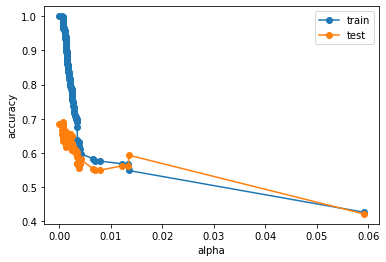

In [80]:
fix ,ax = plt.subplots()
ax.set_xlabel("alpha")
ax.set_ylabel("accuracy")
ax.plot(ccp_alpha,train_score,marker = 'o',label = 'train')
ax.plot(ccp_alpha,test_score,marker = 'o',label = 'test')
ax.legend()

In [81]:
dt_model_ccp = DecisionTreeClassifier(ccp_alpha=.011233)

In [82]:
dt_model_ccp.fit(x_train,y_train)

DecisionTreeClassifier(ccp_alpha=0.011233)

In [83]:
dt_model_ccp.score(x_train,y_train)


0.5762314308053167

In [84]:
dt_model_ccp.score(x_test,y_test)

0.55